In [9]:
# part 1
import pickle
with open("state_policy.pkl", "rb") as f:
    state_policy = pickle.load(f)
with open("states.pkl", "rb") as f:
    states = pickle.load(f)
with open("state_V.pkl", "rb") as f:
    state_V = pickle.load(f)
with open("total_rewards.pkl", "rb") as f:
    total_rewards = pickle.load(f)
with open("action_length.pkl", "rb") as f:
    action_length = pickle.load(f)
with open("visit_time.pkl", "rb") as f:
    visited_time = pickle.load(f)
    
def round_3x4(matrix):
    # First row (index 0, 1, 2, 3)
    matrix[0][0] = round(matrix[0][0] / 1) * 1  # term1
    matrix[0][2] = round(matrix[0][2] / 1) * 1  # term3
    matrix[0][1] = round(matrix[0][1] / 0.04) * 0.04  # term2 0 ~ 0.12 // 0.04 || 4
    matrix[0][3] = round(matrix[0][3] / 0.05) * 0.05  # term4 -0.05 ~ 0.05 // 0.05 || 3
    # Second row (index 1, 2, 3, 4)
    matrix[1][0] = round(matrix[1][0] / 0.01) * 0.01  # term5 -0.16 ~ 0.16 // 0.04 || 9
    matrix[1][1] = round(matrix[1][1] / 0.04) * 0.04  # term6 -0.08 ~ 0.08 // 0.04 || 5
    matrix[1][2] = round(matrix[1][2] / 0.03) * 0.03  # term7 -0.20 ~ 0.20 // 0.05 || 9
    matrix[1][3] = round(matrix[1][3] / 0.03) * 0.03  # term8 -0.04 ~ 0.04 // 0.04 || 3

    matrix[2][0] = round(matrix[2][0] / 0.01) * 0.01  # term5 -0.16 ~ 0.16 // 0.04 || 9
    matrix[2][1] = round(matrix[2][1] / 0.04) * 0.04  # term6 -0.08 ~ 0.08 // 0.04 || 5
    matrix[2][2] = round(matrix[2][2] / 1) * 1  # term7 -0.20 ~ 0.20 // 0.05 || 9
    matrix[2][3] = round(matrix[2][3] / 1) * 1  # term8 -0.04 ~ 0.04 // 0.04 || 3
    return matrix
import numpy as np
from itertools import product
from scipy.spatial import KDTree


term1 = 1
term3 = 1
term2 = np.arange(0, 0.08, 0.04) #4
term2 = np.around(term2, decimals=2)
term4 = 1

term5 = np.arange(-0.03, 0.22, 0.01) #26
term5 = np.around(term5, decimals=2)
term6 = np.arange(-0.04, 0.05, 0.04) #5
term6 = np.around(term6, decimals=2)
term7 = np.arange(-0.20, 0.21, 0.05) #9
term7 = np.around(term7, decimals=2)
term8 = np.arange(-0.04, 0.05, 0.04) #3
term8 = np.around(term8, decimals=2)

term9 = np.arange(-0.03, 0.22, 0.01) #26
term9 = np.around(term9, decimals=2)
term10 = np.arange(-0.04, 0.05, 0.04) #5
term10 = np.around(term10, decimals=2)
term11 = 1
term12 = 1

combinations = product(term2, term5, term6, term7, term8, term9, term10)

states = [
    np.array([
        [term1, t2, term3, term4],
        [t5, t6, t7, t8],
        [t9, t10, term11, term12]
    ])
    for t2, t5, t6, t7, t8, t9, t10 in combinations
]
flattened_states = [matrix.flatten() for matrix in states]
kdtree = KDTree(flattened_states)
print(len(states))

def find_nearest_kdtree(target_matrix, kdtree, matrix_list):
    target_flat = target_matrix.flatten()
    dist, index = kdtree.query(target_flat)
    return index, matrix_list[index]


303750


In [10]:
# part 2
import gymnasium as gym
import highway_env
import numpy as np
import random
# Create the environment
config = {
    "observation": {
        "type": "Kinematics",
        "features": ["x", "y", "vx", "vy"],
        "features_range": {
            "x": [-100, 100],
            "y": [-100, 100],
            "vx": [-20, 20],
            "vy": [-20, 20]
        },
        "absolute": False,
        "lanes_count": 2,
        "vehicles_count": 3
        # "initial_lane_id": 0
    },
        "order": "sorted",
        "lanes_count": 2,
        "vehicles_count": 2,
        # "initial_lane_id": 0,
        "absolute": False
}
env = gym.make('highway-fast-v0', config=config)
num_episodes = 10000
# alpha = 0.05       # Learning rate
gamma = 0.97      # Discount factor
# List to store total rewards and actions for each episode
# total_rewards = []
# action_length = []
# visited_time = [0] * 303750
# state_policy = [1] * 303750
# state_V = [0] * 303750

In [91]:
# part 3
import copy
# epsilon = 0.1         # Initial exploration rate
# min_epsilon = 0.01    # Minimum exploration rate
# epsilon_decay = 0.99 # Decay rate per episode
# Training loop
num_episodes = 5000
for episode in range(num_episodes):
    # epsilon = max(min_epsilon, epsilon * epsilon_decay)
    num_action = 0
    state, _ = env.reset() 
    done = False
    episode_reward = 0 
    while not done:
        next_state_V0 = 0
        next_state_V1 = 0
        next_state_V2 = 0
        next_state_V3 = 0
        next_state_V4 = 0
        state_tuple = round_3x4(state)
        # print(state_tuple)
        nearest_index, nearest_matrix = find_nearest_kdtree(state_tuple, kdtree, states)
        visited_time[nearest_index]+=1
        action0 = 0
        action1 = 1
        action2 = 2
        action3 = 3
        action4 = 4
        env_checkpoint = copy.deepcopy(env)
        next_state0, reward0, done0, additional_info0, info0 = env.step(action0)
        env = copy.deepcopy(env_checkpoint)
        next_state1, reward1, done1, additional_info1, info1 = env.step(action1)
        env = copy.deepcopy(env_checkpoint)
        next_state2, reward2, done2, additional_info2, info2 = env.step(action2)
        env = copy.deepcopy(env_checkpoint)
        next_state3, reward3, done3, additional_info3, info3 = env.step(action3)
        env = copy.deepcopy(env_checkpoint)
        next_state4, reward4, done4, additional_info4, info4 = env.step(action4)
        env = copy.deepcopy(env_checkpoint)
        if done0 == True:
          reward0 = -100
        if done1 == True:
          reward1 = -100
        if done2 == True:
          reward2 = -100
        if done3 == True:
          reward3 = -100
        if done4 == True:
          reward4 = -100
        NS0 = round_3x4(next_state0)
        NS1 = round_3x4(next_state1)
        NS2 = round_3x4(next_state2)
        NS3 = round_3x4(next_state3)
        NS4 = round_3x4(next_state4)
        # print(NS0, NS1, NS2, NS3, NS4)
        nearest_index0, nearest_matrix0 = find_nearest_kdtree(NS0, kdtree, states)
        nearest_index1, nearest_matrix1 = find_nearest_kdtree(NS1, kdtree, states)
        nearest_index2, nearest_matrix2 = find_nearest_kdtree(NS2, kdtree, states)
        nearest_index3, nearest_matrix3 = find_nearest_kdtree(NS3, kdtree, states)
        nearest_index4, nearest_matrix4 = find_nearest_kdtree(NS4, kdtree, states)
        next_state_V0 = state_V[nearest_index0]
        next_state_V1 = state_V[nearest_index1]
        next_state_V2 = state_V[nearest_index2]
        next_state_V3 = state_V[nearest_index3]
        next_state_V4 = state_V[nearest_index4]
        V0 = reward0 + gamma * next_state_V0
        V1 = reward1 + gamma * next_state_V1
        V2 = reward2 + gamma * next_state_V2
        V3 = reward3 + gamma * next_state_V3
        V4 = reward4 + gamma * next_state_V4
        action = np.argmax([V0, V1, V2, V3, V4])
        V0 = V0-state_V[nearest_index]
        V1 = V1-state_V[nearest_index]
        V2 = V2-state_V[nearest_index]
        V3 = V3-state_V[nearest_index]
        V4 = V4-state_V[nearest_index]
        this_state_V = [V0, V1, V2, V3, V4]
        next_s = [next_state0, next_state1, next_state2, next_state3, next_state4]
        next_d = [done0, done1, done2, done3, done4]
        next_r = [reward0, reward1, reward2, reward3, reward4]
        next_add = [additional_info0, additional_info1, additional_info2, additional_info3, additional_info4]
        next_info = [info0, info1, info2, info3, info4]
        state_policy[nearest_index]=action
        state_V[nearest_index] = state_V[nearest_index] + (1/visited_time[nearest_index]) * this_state_V[action] 
        # if random.random() < epsilon :
        #     a = random.choice([0, 1, 2, 3, 4])  # Explore
        # else:
        a = action  #explolite
        done = next_d[a]
        state = next_s[a]
        if a == 0:
            env.step(action0)
        if a == 1:
            env.step(action1)
        if a == 2:
            env.step(action2)
        if a == 3:
            env.step(action3)
        if a == 4:
            env.step(action4)
        print(visited_time[nearest_index], state_V[nearest_index], a, action, V0, V1, V2, V3, V4)
        reward = next_r[a]
        additional_info = next_add[a]
        info = next_info[a]
        num_action += 1
        episode_reward += reward
        if additional_info:
          done = True
    total_rewards.append(episode_reward)
    action_length.append(num_action)
    print("Number of episde:                 ",episode,num_action)

388 6.0279335656344655 0 0 0.6192098700827762 0.6192098700827762 -5.160292945565497 -5.110562629613895 -5.342112698201001
389 6.029919297432575 3 3 -5.227933565634466 -5.227933565634466 -5.161888847292515 0.7724496694645726 -5.343708599928018
142 6.086513550950965 0 0 2.8268164882547246 2.8268164882547246 -0.7094968951796661 2.8268164882547246 -5.2513602975319715
123 8.216977699531835 0 0 1.0228803066871794 1.0228803066871794 -205.20866159947747 1.0228803066871794 -7.391407788205757
407 8.557581419400435 0 0 0.9822194857205169 0.9822194857205169 -108.5551681037107 0.9822194857205169 -7.7376499018255664
1477 8.8708734456669 0 0 0.9941413593031196 0.9941413593031196 0.5175613990298622 0.9941413593031196 -8.052647345421825
1424 9.20817355150979 2 2 -2.3552507875275186 -2.3552507875275186 1.3427799331348513 -2.3552507875275186 -8.389672984379827
188 9.849647522853175 1 1 -8.912983622941361 0.7122452160701194 0.7122452160701194 0.7122452160701194 -8.96163440810934
223 9.857329975937034 1 1 

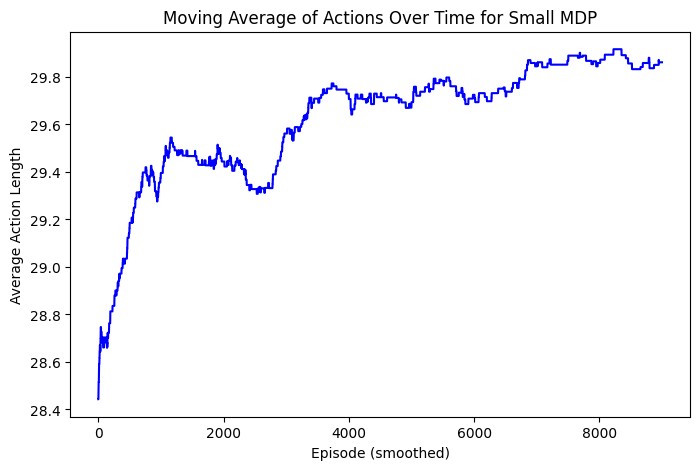

In [6]:
# part 4
import matplotlib.pyplot as plt
import numpy as np

window_size = 1000
moving_avg = np.convolve(action_length, np.ones(window_size)/window_size, mode='valid')

plt.figure(figsize=(8, 5))
plt.plot(moving_avg, color='b')
plt.title("Moving Average of Actions Over Time for Small MDP")
plt.xlabel("Episode (smoothed)")
plt.ylabel("Average Action Length")
plt.show()


In [135]:
# part 5
testlength = []
testreward = []
percentage_30 = 0
for q in range (10000): # can adjust the number for episodes
    test_action_length = 0
    rewardtest = 0
    done = False
    state, _ = env.reset()
    while not done:
        s1 = round_3x4(state)
        c1, c2 = find_nearest_kdtree(s1, kdtree, states)
        action = state_policy[c1]
        n_state, reward, done, additional_info, info = env.step(action)
        test_action_length += 1
        # print(q, action, reward, c2)
        a = n_state
        rewardtest += reward
        # time.sleep(1)
        state = n_state
        if additional_info:
            done = True
    testlength.append(test_action_length)
    testreward.append(rewardtest)
percentage_30 = sum(1 for length in testlength if length >= 30) / 10000 * 100
average_reward = sum(testreward) / 10000

print(f"Success Rate: {percentage_30}%")
print(f"Average reward: {average_reward}")

Success Rate: 87.8%
Average reward: 24.22781407012097


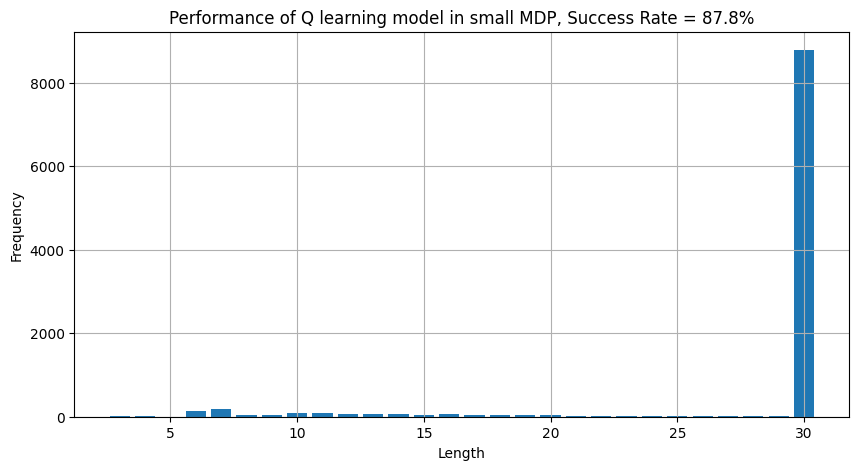

In [136]:
import matplotlib.pyplot as plt
from collections import Counter
plt.figure(figsize=(10, 5))
frequency = Counter(testlength)
values = sorted(frequency.keys())
counts = [frequency[val] for val in values] 
plt.bar(values, counts)
plt.title(f"Performance of Q learning model in small MDP, Success Rate = {round(percentage_30,2)}%")
plt.xlabel("Length")
plt.ylabel("Frequency")
plt.grid()
plt.show()

In [138]:
# part 6
import pickle
# Save lists to files
with open("state_policy.pkl", "wb") as f:
    pickle.dump(state_policy, f)
with open("state_V.pkl", "wb") as f:
    pickle.dump(state_V, f)
with open("total_rewards.pkl", "wb") as f:
    pickle.dump(total_rewards, f)
with open("action_length.pkl", "wb") as f:
    pickle.dump(action_length, f)
with open("states.pkl", "wb") as f:
    pickle.dump(states, f)
with open("visit_time.pkl", "wb") as f:
    pickle.dump(visited_time, f)

In [17]:
filtered_states = [states[i] for i in range(len(visited_time)) if visited_time[i] >= 1]
filtered_policy = [state_policy[i] for i in range(len(visited_time)) if visited_time[i] >= 1]
flattened_states1 = [matrix.flatten() for matrix in filtered_states]
kdtree1 = KDTree(flattened_states1)
print(len(filtered_states),len(filtered_policy))

1379 1379
